# Bad Car Purchases

In [12]:
# Load necessary modules
%matplotlib inline

from __future__ import division
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

# Set the random seed for reproducability
np.random.seed(42)

### Loading and inspecting the data with EDA

In [13]:
# Load in data and create training and test sets. dropping all na columns, for kicks.
car_train = pd.read_csv('lemon_training.csv')
car_test = pd.read_csv('lemon_test.csv')

car_train.info()

ERROR! Session/line number was not unique in database. History logging moved to new session 237
<class 'pandas.core.frame.DataFrame'>
Int64Index: 51088 entries, 0 to 51087
Data columns (total 34 columns):
RefId                                51088 non-null int64
IsBadBuy                             51088 non-null int64
PurchDate                            51088 non-null object
Auction                              51088 non-null object
VehYear                              51088 non-null int64
VehicleAge                           51088 non-null int64
Make                                 51088 non-null object
Model                                51088 non-null object
Trim                                 49426 non-null object
SubModel                             51082 non-null object
Color                                51082 non-null object
Transmission                         51081 non-null object
WheelTypeID                          48819 non-null float64
WheelType                      

In [14]:
car_train.head()

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,...,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,...,11597,12409,NaN,NaN,21973,33619,FL,7100,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,...,11374,12791,NaN,NaN,19638,33619,FL,7600,0,1053
2,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,...,6739,7911,NaN,NaN,19638,33619,FL,4000,0,1020
3,6,0,12/7/2009,ADESA,2004,5,MITSUBISHI,GALANT 4C,ES,4D SEDAN ES,...,8149,9451,NaN,NaN,19638,33619,FL,5600,0,594
4,7,0,12/7/2009,ADESA,2004,5,KIA,SPECTRA,EX,4D SEDAN EX,...,6230,8603,NaN,NaN,19638,33619,FL,4200,0,533


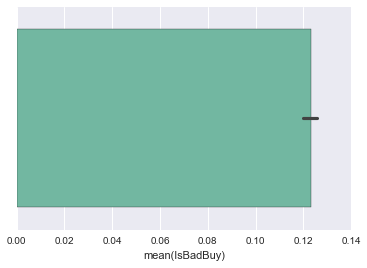

In [18]:
# Is the training dataset balanced (# bad purchases = # good purchases)?
sns.barplot(x="IsBadBuy", palette="Set2", data=car_train);

In [20]:
car_train['IsBadBuy'].value_counts()

0    44799
1     6289
dtype: int64

It seems like we will need to balance the training dataset, but first let's explore the data a bit more.

In [ ]:
### Not enough memory to run that. I wanted to put 6 vars in there... 
feat = ['IsBadBuy', 'MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice']
pp_car_train = car_train[feat]

In [31]:
# Are there any null values?
any(pp_car_train.isnull())

True

# whoops!

In [40]:
# Let's see which rows have missing values...
pp_car_train[pp_car_train.isnull().sum(1) > 0]

,IsBadBuy,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice
512,0,NaN,NaN
4567,0,NaN,NaN
5140,0,NaN,NaN
8181,0,NaN,NaN
9192,0,NaN,NaN
9194,0,NaN,NaN
17611,1,NaN,NaN
18158,0,NaN,NaN
18597,0,NaN,NaN
25425,0,NaN,NaN


# Aha!

In [42]:
# Kill it with fire.
pp_car_train = pp_car_train[pp_car_train.isnull().sum(1) == 0]

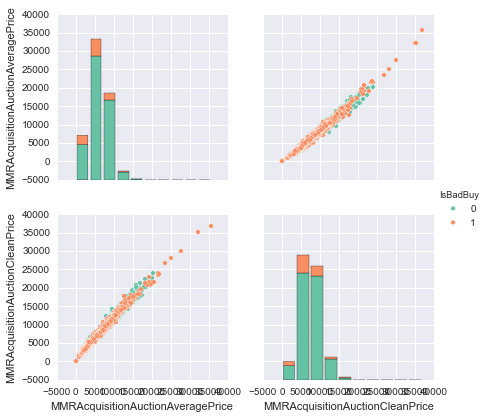

In [48]:
sns.pairplot(pp_car_train, hue='IsBadBuy', size=3, palette="Set2", vars=['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice']);

# Scheiße! More missing values!

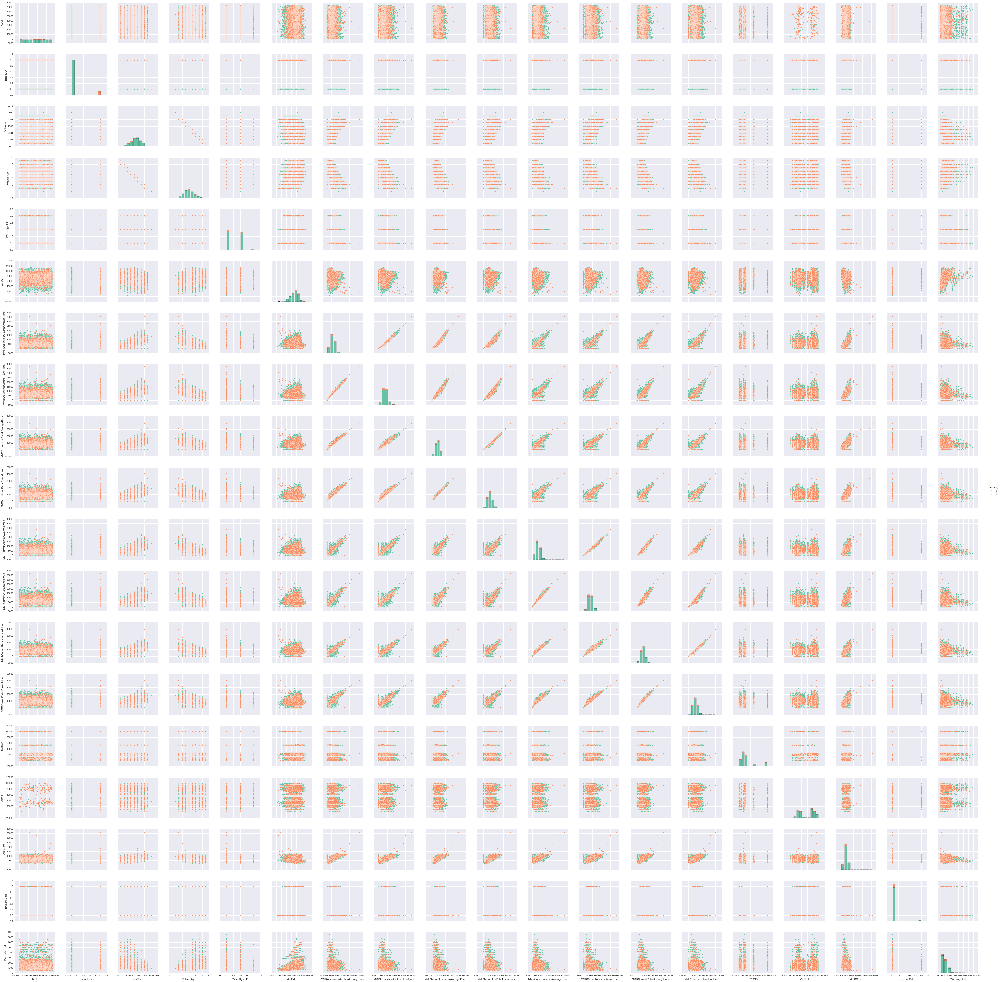

In [85]:
# Plotting parameters against each other again for the balanced dataset
sns.pairplot(car_train, hue="IsBadBuy", size=3, palette="Set2");

In [52]:
# Let's see which columns have missing values...
car_train.isnull().sum() > 0

RefId                                False
IsBadBuy                             False
PurchDate                            False
Auction                              False
VehYear                              False
VehicleAge                           False
Make                                 False
Model                                False
Trim                                  True
SubModel                              True
Color                                 True
Transmission                          True
WheelTypeID                           True
WheelType                             True
VehOdo                               False
Nationality                           True
Size                                  True
TopThreeAmericanName                  True
MMRAcquisitionAuctionAveragePrice     True
MMRAcquisitionAuctionCleanPrice       True
MMRAcquisitionRetailAveragePrice      True
MMRAcquisitonRetailCleanPrice         True
MMRCurrentAuctionAveragePrice         True
MMRCurrentA

## Quite a few... inspect them manually to see why they are missing, and either remove the row or fix them.... ah that's what you are doing next... nice!

### Feature Selection

In [55]:
# Generating a list of continuous data features from the describe dataframe. 
# Then, removing the two non-features (RefId is an index, IsBadBuy is the prediction value)
features = list(car_train.describe().columns)
features.remove('RefId')
features.remove('IsBadBuy')

In [57]:
# Finding the most divisive features from their gini
# purity = lambda x : np.max(x) / np.sum(x)
# for f in features:
#     gini = 1 - np.sum([np.square(node) for node in [purity(f), 1 - purity(f)]])
#     print '%s - %s' % (f, gini)

### Dealing with missing Values

Let's study which features have blanks and in which proportions

In [47]:
for c in car_train.columns:
    count_blanks = car_train[c].isnull().sum()
    print c, count_blanks

RefId 0
IsBadBuy 0
PurchDate 0
Auction 0
VehYear 0
VehicleAge 0
Make 0
Model 0
Trim 1662
SubModel 6
Color 6
Transmission 7
WheelTypeID 2269
WheelType 2272
VehOdo 0
Nationality 2
Size 2
TopThreeAmericanName 2
MMRAcquisitionAuctionAveragePrice 12
MMRAcquisitionAuctionCleanPrice 12
MMRAcquisitionRetailAveragePrice 12
MMRAcquisitonRetailCleanPrice 12
MMRCurrentAuctionAveragePrice 216
MMRCurrentAuctionCleanPrice 216
MMRCurrentRetailAveragePrice 216
MMRCurrentRetailCleanPrice 216
PRIMEUNIT 48700
AUCGUART 48700
BYRNO 0
VNZIP1 0
VNST 0
VehBCost 0
IsOnlineSale 0
WarrantyCost 0


We would want to extrapolate the missing values for the features we detected as being important. 

### Balancing the training dataset

In [53]:
# Balancing the sampling (to have as many bad purchases as good ones)
n = min(car_train.IsBadBuy.value_counts())
N = max(car_train.IsBadBuy.value_counts())

min_class = int(car_train.IsBadBuy.value_counts().idxmin())
max_class = int(car_train.IsBadBuy.value_counts().idxmax())

min_rows = car_train[car_train.IsBadBuy == min_class].index
max_rows = random.sample(car_train[car_train.IsBadBuy == max_class].index, n)

rows = np.r_[min_rows, max_rows]
car_bal_train = car_train.ix[rows,:]

print '--- Initial Sampling'
print car_train['IsBadBuy'].value_counts()

print '--- Balanced Sampling'
print car_bal_train['IsBadBuy'].value_counts()

--- Initial Sampling
0    44799
1     6289
dtype: int64
--- Balanced Sampling
1    6289
0    6289
dtype: int64


### Test/Train Split & Cross Validation

In [56]:
# Creating the actual training and test sets. Yours should cross validate on the training data.
from sklearn import metrics, tree, cross_validation

train_X = car_train[features].values
train_y = car_train.IsBadBuy.values
test_X = car_test[features].values

### Classify & Predict

In [57]:
# Create a classifier and prediction.
clf = tree.DecisionTreeClassifier().fit(train_X, train_y)

# Limiting depth & leaf samples sizes
clf.set_params(min_samples_leaf=4)
clf.set_params(max_depth=3)
clf = clf.fit(iris.data, iris.target)

clf.score(train_X, train_y)
y_pred = clf.predict(test_X)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

# It threw a ValueError! ... and it explains what the possible issues could be... let's investigate

In [59]:
for c in car_train.columns:
    count_inf = sum(car_train[c] == np.inf)
    count_ninf = sum(car_train[c] == -np.inf)
    print c, count_inf, count_ninf

RefId 0 0
IsBadBuy 0 0
PurchDate 0 0
Auction 0 0
VehYear 0 0
VehicleAge 0 0
Make 0 0
Model 0 0
Trim 0 0
SubModel 0 0
Color 0 0
Transmission 0 0
WheelTypeID 0 0
WheelType 0 0
VehOdo 0 0
Nationality 0 0
Size 0 0
TopThreeAmericanName 0 0
MMRAcquisitionAuctionAveragePrice 0 0
MMRAcquisitionAuctionCleanPrice 0 0
MMRAcquisitionRetailAveragePrice 0 0
MMRAcquisitonRetailCleanPrice 0 0
MMRCurrentAuctionAveragePrice 0 0
MMRCurrentAuctionCleanPrice 0 0
MMRCurrentRetailAveragePrice 0 0
MMRCurrentRetailCleanPrice 0 0
PRIMEUNIT 0 0
AUCGUART 0 0
BYRNO 0 0
VNZIP1 0 0
VNST 0 0
VehBCost 0 0
IsOnlineSale 0 0
WarrantyCost 0 0


# So it's not the issues we have with infinity... missing value issues?

In [60]:
for c in car_train.columns:
    count_blanks = car_train[c].isnull().sum()
    print c, count_blanks

RefId 0
IsBadBuy 0
PurchDate 0
Auction 0
VehYear 0
VehicleAge 0
Make 0
Model 0
Trim 1662
SubModel 6
Color 6
Transmission 7
WheelTypeID 2269
WheelType 2272
VehOdo 0
Nationality 2
Size 2
TopThreeAmericanName 2
MMRAcquisitionAuctionAveragePrice 12
MMRAcquisitionAuctionCleanPrice 12
MMRAcquisitionRetailAveragePrice 12
MMRAcquisitonRetailCleanPrice 12
MMRCurrentAuctionAveragePrice 216
MMRCurrentAuctionCleanPrice 216
MMRCurrentRetailAveragePrice 216
MMRCurrentRetailCleanPrice 216
PRIMEUNIT 48700
AUCGUART 48700
BYRNO 0
VNZIP1 0
VNST 0
VehBCost 0
IsOnlineSale 0
WarrantyCost 0


# Ah yeah! You had observed the missing values, but hadn't taken care of them yet!

In [ ]:
# Too many missing values
car_train.drop('AUCGUART',axis=1, inplace=True)
car_train.drop('PRIMEUNIT',axis=1, inplace=True)

In [74]:
# Inspect the rows if you have the time, otherwise just drop them.
# How many rows are we left with?
len(car_train.dropna())

47036

In [75]:
# Sufficient!
car_train = car_train.dropna()

In [86]:
# Finally... our massive pairplot
sns.pairplot(car_train, hue="IsBadBuy", size=6, palette="Set2");
# Yeah... use the 'vars' parameter like I did before to make smaller, more managable plots :)

# Back to work.

In [79]:
train_X = car_train[features].values
train_y = car_train.IsBadBuy.values
test_X = car_test[features].values

# Create a classifier and prediction.
clf = tree.DecisionTreeClassifier()

# Limiting depth & leaf samples sizes
clf.set_params(min_samples_leaf=4)
clf.set_params(max_depth=3)
clf = clf.fit(iris.data, iris.target)

clf.score(train_X, train_y)
y_pred = clf.predict(test_X)

NameError: name 'iris' is not defined

# Say What?!

In [82]:
# Sans Flowers
clf.fit(train_X, train_y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=4,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            random_state=None, splitter='best')

In [83]:
clf.score(train_X, train_y)


0.90547665617824646

# Oh yeah!

In [84]:
y_pred = clf.predict(test_X)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

# ah... I should have made a nice cleaning function and applied it to both your datasets, but I think you get it now, right?

In [ ]:
# Create image
with open("cars.dot", 'w') as f:
    f = tree.export_graphviz(clf, out_file=f)
    
!dot -Tpng cars.dot > cars.png

### Create a Submission

In [ ]:
# Create a submission
submission = pd.DataFrame({ 'RefId' : l_test.RefId, 'prediction' : y_pred })
submission.to_csv('submission.csv')

### Hints & Clues

In [ ]:
# Where's cross validation? 
# Why did you drop the features? Need to look at the most divisive features (class if module from feature selection)
# May make use of EDA?
# This is a lazy attempt
# Try random forests?